# Phase 1 — ASL Base Model: EDA, Training & Evaluation

**Goal:** Train EfficientNet-B0 on the ASL Alphabet dataset as a feature extractor for NGT transfer learning.


## 1. Setup & Imports

In [2]:
import os, random, json, warnings
from pathlib import Path
from collections import Counter

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import seaborn as sns
from PIL import Image
from tqdm import tqdm

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, Subset
from torchvision import datasets, transforms, models
from torchvision.models import efficientnet_b0, EfficientNet_B0_Weights
from sklearn.model_selection import StratifiedShuffleSplit
from sklearn.metrics import (
    classification_report, confusion_matrix,
    accuracy_score, f1_score, top_k_accuracy_score
)

warnings.filterwarnings("ignore")

In [39]:
# Reproducibility
SEED = 42
random.seed(SEED); np.random.seed(SEED); torch.manual_seed(SEED)
torch.backends.cudnn.deterministic = True

In [40]:
# Device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")
if device.type == "cuda":
    print(f"  GPU: {torch.cuda.get_device_name(0)}")
    print(f"  VRAM: {torch.cuda.get_device_properties(0).total_memory / 1e9:.1f} GB")

Using device: cuda
  GPU: NVIDIA GeForce RTX 4050 Laptop GPU
  VRAM: 6.4 GB


In [ ]:
# Update these paths to match your local setup
DATA_DIR    = Path("../Data/asl_alphabet_train/asl_alphabet_train")
CKPT_DIR    = Path("../checkpoints")
RESULTS_DIR = Path("../results/asl_results")
CKPT_DIR.mkdir(parents=True, exist_ok=True)
RESULTS_DIR.mkdir(parents=True, exist_ok=True)

letter_folders = sorted([d.name for d in DATA_DIR.iterdir() if d.is_dir()])

In [42]:
# Configurations
IMG_SIZE    = 224
BATCH_SIZE  = 32
VAL_SPLIT   = 0.20
NUM_WORKERS = 4
LR          = 1e-3
EPOCHS      = 25
PATIENCE    = 4          # early stopping
NUM_CLASSES = len(letter_folders)   # auto-detected from your folder structure

## 2. Exploratory Data Analysis

### 2.1. Dataset Overview

In [43]:
# Collect all image paths and labels
all_paths, all_labels, all_classes = [], [], []
class_dirs  = sorted([d for d in DATA_DIR.iterdir() if d.is_dir()])
class_names = [d.name for d in class_dirs]
class_to_idx = {c: i for i, c in enumerate(class_names)}

for cls_dir in class_dirs:
    imgs = list(cls_dir.glob("*.jpg")) + list(cls_dir.glob("*.png")) + list(cls_dir.glob("*.jpeg"))
    for p in imgs:
        all_paths.append(p)
        all_labels.append(class_to_idx[cls_dir.name])
        all_classes.append(cls_dir.name)

df = pd.DataFrame({"path": all_paths, "label": all_labels, "class": all_classes})
print(f"Total images   : {len(df):,}")
print(f"Classes found  : {len(class_names)}  →  {class_names}")
print(f"Images/class   : min={df['class'].value_counts().min()}  "
      f"max={df['class'].value_counts().max()}  "
      f"mean={df['class'].value_counts().mean():.0f}")

Total images   : 87,000
Classes found  : 29  →  ['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J', 'K', 'L', 'M', 'N', 'O', 'P', 'Q', 'R', 'S', 'T', 'U', 'V', 'W', 'X', 'Y', 'Z', 'del', 'nothing', 'space']
Images/class   : min=3000  max=3000  mean=3000


### 2.2. Class Distribution

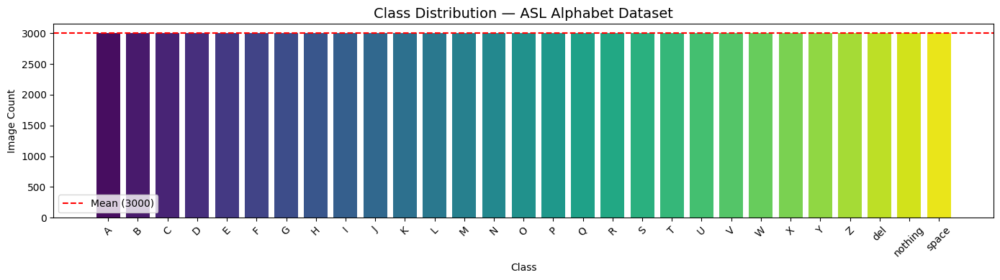

Imbalance ratio (max/min): 1.00


In [44]:
counts = df["class"].value_counts().sort_index()

fig, ax = plt.subplots(figsize=(14, 4))
bars = ax.bar(counts.index, counts.values, color=sns.color_palette("viridis", len(counts)))
ax.axhline(counts.mean(), color="red", ls="--", lw=1.5, label=f"Mean ({counts.mean():.0f})")
ax.set_title("Class Distribution — ASL Alphabet Dataset", fontsize=14)
ax.set_xlabel("Class"); ax.set_ylabel("Image Count")
ax.legend(); plt.xticks(rotation=45); plt.tight_layout()
plt.savefig(RESULTS_DIR / "eda_class_distribution.png", dpi=150)
plt.show()

imbalance_ratio = counts.max() / counts.min()
print(f"Imbalance ratio (max/min): {imbalance_ratio:.2f}")

### 1.3. Sample Images per Class

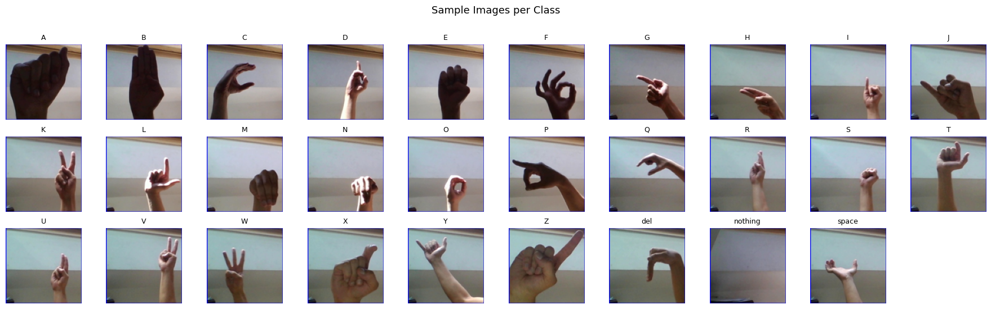

In [45]:
n_cols = 10
n_rows = (len(class_names) + n_cols - 1) // n_cols
fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 1.8, n_rows * 1.8))
axes = axes.flatten()

for i, cls in enumerate(class_names):
    sample = df[df["class"] == cls].sample(1, random_state=SEED).iloc[0]
    img = Image.open(sample["path"]).resize((112, 112))
    axes[i].imshow(img)
    axes[i].set_title(cls, fontsize=9)
    axes[i].axis("off")
for j in range(i + 1, len(axes)):
    axes[j].axis("off")

plt.suptitle("Sample Images per Class", fontsize=13, y=1.01)
plt.tight_layout()
plt.savefig(RESULTS_DIR / "eda_sample_images.png", dpi=150, bbox_inches="tight")
plt.show()


### 2.4. Image properties

Resolution range — W: 200–200px  H: 200–200px
Channel means (approx) — R:133.2  G:128.2  B:132.2


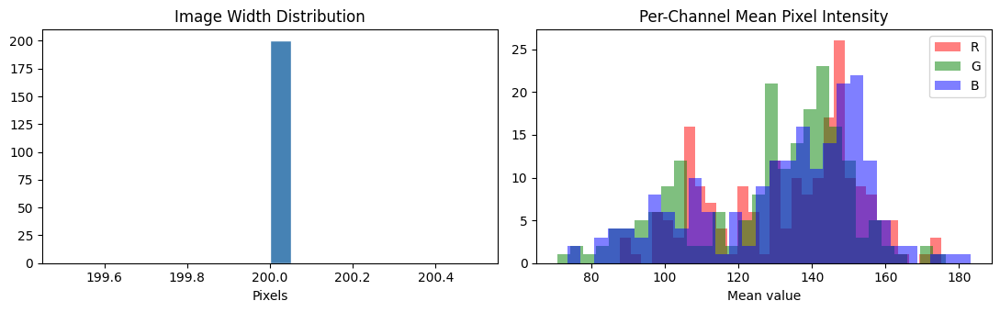

In [46]:
sample_df = df.sample(200, random_state=SEED)
widths, heights, means_r, means_g, means_b = [], [], [], [], []

for _, row in sample_df.iterrows():
    img = np.array(Image.open(row["path"]).convert("RGB"))
    heights.append(img.shape[0]); widths.append(img.shape[1])
    means_r.append(img[:,:,0].mean())
    means_g.append(img[:,:,1].mean())
    means_b.append(img[:,:,2].mean())

print(f"Resolution range — W: {min(widths)}–{max(widths)}px  H: {min(heights)}–{max(heights)}px")
print(f"Channel means (approx) — R:{np.mean(means_r):.1f}  G:{np.mean(means_g):.1f}  B:{np.mean(means_b):.1f}")

fig, axes = plt.subplots(1, 2, figsize=(11, 3.5))
axes[0].hist(widths, bins=20, color="steelblue", edgecolor="white")
axes[0].set_title("Image Width Distribution"); axes[0].set_xlabel("Pixels")
for ch, vals, col in zip(["R","G","B"], [means_r, means_g, means_b], ["red","green","blue"]):
    axes[1].hist(vals, bins=30, alpha=0.5, color=col, label=ch)
axes[1].set_title("Per-Channel Mean Pixel Intensity"); axes[1].set_xlabel("Mean value")
axes[1].legend(); plt.tight_layout()
plt.savefig(RESULTS_DIR / "eda_image_properties.png", dpi=150)
plt.show()

### 2.5. Stratified Train/Val Split 

Train : 69,600 images
Val   : 17,400 images


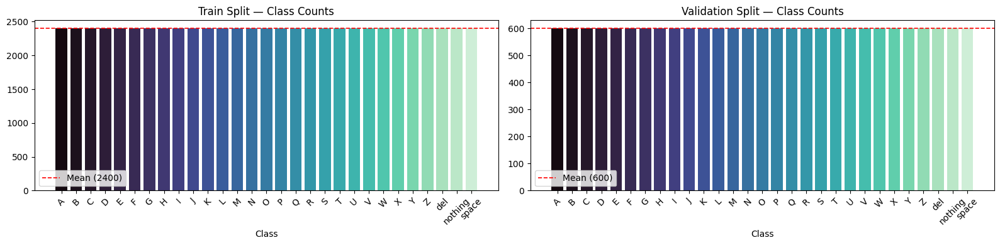


Max proportion deviation (train vs val): 0.0 %


,train_%,val_%,diff_%
class,,,
A,3.45,3.45,0.0
B,3.45,3.45,0.0
C,3.45,3.45,0.0
D,3.45,3.45,0.0
E,3.45,3.45,0.0
F,3.45,3.45,0.0
G,3.45,3.45,0.0
H,3.45,3.45,0.0
I,3.45,3.45,0.0


In [47]:
sss = StratifiedShuffleSplit(n_splits=1, test_size=VAL_SPLIT, random_state=SEED)
train_idx, val_idx = next(sss.split(df["path"], df["label"]))

train_df = df.iloc[train_idx]
val_df   = df.iloc[val_idx]

print(f"Train : {len(train_df):,} images")
print(f"Val   : {len(val_df):,} images")

# Verify balance
train_counts = train_df["class"].value_counts().sort_index()
val_counts   = val_df["class"].value_counts().sort_index()

fig, axes = plt.subplots(1, 2, figsize=(16, 4), sharey=False)
for ax, counts_data, title in zip(
    axes,
    [train_counts, val_counts],
    ["Train Split — Class Counts", "Validation Split — Class Counts"]
):
    ax.bar(counts_data.index, counts_data.values,
           color=sns.color_palette("mako", len(counts_data)))
    ax.axhline(counts_data.mean(), color="red", ls="--", lw=1.2,
               label=f"Mean ({counts_data.mean():.0f})")
    ax.set_title(title); ax.set_xlabel("Class")
    ax.legend(); plt.setp(ax.xaxis.get_majorticklabels(), rotation=45)
plt.tight_layout()
plt.savefig(RESULTS_DIR / "eda_split_balance.png", dpi=150)
plt.show()

# Class proportion comparison (train vs val)
prop_compare = pd.DataFrame({
    "train_%": (train_counts / train_counts.sum() * 100).round(2),
    "val_%"  : (val_counts   / val_counts.sum()   * 100).round(2),
})
prop_compare["diff_%"] = (prop_compare["train_%"] - prop_compare["val_%"]).abs()
print("\nMax proportion deviation (train vs val):", prop_compare["diff_%"].max(), "%")
prop_compare

## 3. Data Pipelines

In [48]:
#  ImageNet normalisation stats
IMAGENET_MEAN = [0.485, 0.456, 0.406]
IMAGENET_STD  = [0.229, 0.224, 0.225]

train_transforms = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.RandomHorizontalFlip(),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.1),
    transforms.RandomAffine(degrees=0, translate=(0.05, 0.05)),  # NO rotation — experimental var
    transforms.ToTensor(),
    transforms.Normalize(IMAGENET_MEAN, IMAGENET_STD),
])

val_transforms = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(IMAGENET_MEAN, IMAGENET_STD),
])

# ImageFolder expects subfolders per class — your structure matches this exactly
full_dataset = datasets.ImageFolder(str(DATA_DIR))

# Remap indices to our stratified split
train_dataset = Subset(full_dataset, train_idx.tolist())
val_dataset   = Subset(full_dataset, val_idx.tolist())

# Patch transforms per subset
class TransformSubset(torch.utils.data.Dataset):
    def __init__(self, subset, transform):
        self.subset = subset; self.transform = transform
    def __len__(self): return len(self.subset)
    def __getitem__(self, idx):
        img, label = self.subset[idx]
        if self.transform:
            img = self.transform(img)
        return img, label

train_set = TransformSubset(train_dataset, train_transforms)
val_set   = TransformSubset(val_dataset,   val_transforms)

train_loader = DataLoader(train_set, batch_size=BATCH_SIZE, shuffle=True,
                          num_workers=NUM_WORKERS, pin_memory=True)
val_loader   = DataLoader(val_set,   batch_size=BATCH_SIZE, shuffle=False,
                          num_workers=NUM_WORKERS, pin_memory=True)

print(f"Train batches: {len(train_loader)} | Val batches: {len(val_loader)}")

Train batches: 2175 | Val batches: 544


## 4. Model - EfficientNet-B0

In [49]:
NUM_CLASSES = len(full_dataset.classes)
print(f"NUM_CLASSES set to: {NUM_CLASSES}")


NUM_CLASSES set to: 29


In [50]:
weights = EfficientNet_B0_Weights.IMAGENET1K_V1
model = efficientnet_b0(weights=weights)

# Replace classifier head
in_features = model.classifier[1].in_features
model.classifier = nn.Sequential(
    nn.Dropout(p=0.3, inplace=True),
    nn.Linear(in_features, NUM_CLASSES)
)

model = model.to(device)
total_params     = sum(p.numel() for p in model.parameters())
trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
print(f"Total params    : {total_params:,}")
print(f"Trainable params: {trainable_params:,}")

# Loss & optimiser
criterion = nn.CrossEntropyLoss(label_smoothing=0.1)
optimizer = optim.Adam(model.parameters(), lr=LR, weight_decay=1e-4)
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=EPOCHS)

Total params    : 4,044,697
Trainable params: 4,044,697


## 5. Training

In [51]:
def train_epoch(model, loader, criterion, optimizer):
    model.train()
    running_loss, correct, total = 0.0, 0, 0
    for imgs, labels in tqdm(loader, leave=False, desc="Train"):
        imgs, labels = imgs.to(device), labels.to(device)
        optimizer.zero_grad()
        out = model(imgs)
        loss = criterion(out, labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item() * imgs.size(0)
        correct += (out.argmax(1) == labels).sum().item()
        total += imgs.size(0)
    return running_loss / total, correct / total

def eval_epoch(model, loader, criterion):
    model.eval()
    running_loss, correct, total = 0.0, 0, 0
    all_preds, all_labels, all_probs = [], [], []
    with torch.no_grad():
        for imgs, labels in tqdm(loader, leave=False, desc="Val"):
            imgs, labels = imgs.to(device), labels.to(device)
            out = model(imgs)
            loss = criterion(out, labels)
            running_loss += loss.item() * imgs.size(0)
            probs = torch.softmax(out, dim=1)
            preds = out.argmax(1)
            correct += (preds == labels).sum().item()
            total   += imgs.size(0)
            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
            all_probs.extend(probs.cpu().numpy())
    return (running_loss / total, correct / total,
            np.array(all_preds), np.array(all_labels), np.array(all_probs))

# Training loop 
history = {"train_loss":[], "val_loss":[], "train_acc":[], "val_acc":[]}
best_val_acc, patience_cnt = 0.0, 0

for epoch in range(1, EPOCHS + 1):
    tr_loss, tr_acc = train_epoch(model, train_loader, criterion, optimizer)
    vl_loss, vl_acc, _, _, _ = eval_epoch(model, val_loader, criterion)
    scheduler.step()

    history["train_loss"].append(tr_loss); history["val_loss"].append(vl_loss)
    history["train_acc"].append(tr_acc);   history["val_acc"].append(vl_acc)

    print(f"Epoch {epoch:02d}/{EPOCHS} | "
          f"Train Loss: {tr_loss:.4f}  Acc: {tr_acc:.4f} | "
          f"Val Loss: {vl_loss:.4f}  Acc: {vl_acc:.4f}")

    if vl_acc > best_val_acc:
        best_val_acc = vl_acc
        patience_cnt = 0
        torch.save({"epoch": epoch, "model_state": model.state_dict(),
                    "val_acc": vl_acc, "class_names": class_names},
                   CKPT_DIR / "best_asl_model.pth")
        print(f"  ✓ Saved best model (val_acc={vl_acc:.4f})")
    else:
        patience_cnt += 1
        if patience_cnt >= PATIENCE:
            print(f"  Early stopping at epoch {epoch}")
            break

print(f"\nBest validation accuracy: {best_val_acc:.4f}")
json.dump(history, open(RESULTS_DIR / "training_history.json", "w"))

Train:   0%|          | 0/2175 [00:00<?, ?it/s]

Epoch 01/25 | Train Loss: 0.7355  Acc: 0.9801 | Val Loss: 0.6620  Acc: 0.9989
  ✓ Saved best model (val_acc=0.9989)


Epoch 02/25 | Train Loss: 0.6872  Acc: 0.9940 | Val Loss: 0.7135  Acc: 0.9848


Epoch 03/25 | Train Loss: 0.6801  Acc: 0.9953 | Val Loss: 0.6675  Acc: 0.9961


Epoch 04/25 | Train Loss: 0.6776  Acc: 0.9955 | Val Loss: 0.6778  Acc: 0.9961


Epoch 05/25 | Train Loss: 0.6687  Acc: 0.9967 | Val Loss: 0.6666  Acc: 0.9964
  Early stopping at epoch 5

Best validation accuracy: 0.9989


## 6. Evaluation

### 6.1. Training Curves

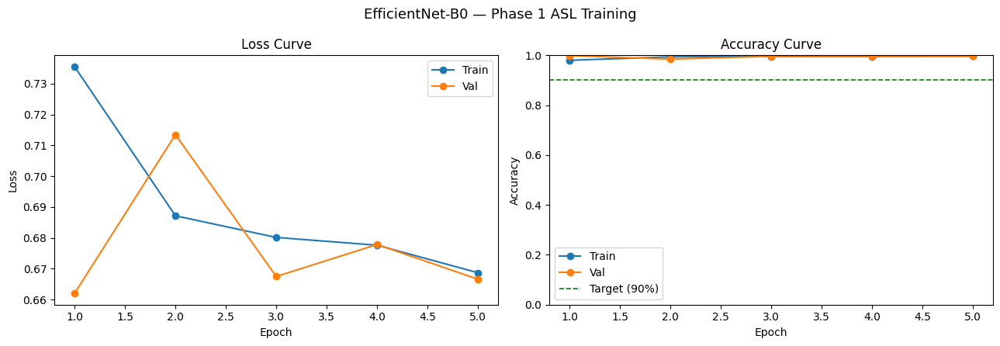

In [52]:
epochs_ran = range(1, len(history["train_loss"]) + 1)

fig, axes = plt.subplots(1, 2, figsize=(13, 4.5))
axes[0].plot(epochs_ran, history["train_loss"], label="Train", marker="o")
axes[0].plot(epochs_ran, history["val_loss"],   label="Val",   marker="o")
axes[0].set_title("Loss Curve"); axes[0].set_xlabel("Epoch"); axes[0].set_ylabel("Loss")
axes[0].legend()

axes[1].plot(epochs_ran, history["train_acc"], label="Train", marker="o")
axes[1].plot(epochs_ran, history["val_acc"],   label="Val",   marker="o")
axes[1].axhline(0.90, color="green", ls="--", lw=1.2, label="Target (90%)")
axes[1].set_title("Accuracy Curve"); axes[1].set_xlabel("Epoch"); axes[1].set_ylabel("Accuracy")
axes[1].legend(); axes[1].set_ylim(0, 1)

plt.suptitle("EfficientNet-B0 — Phase 1 ASL Training", fontsize=13)
plt.tight_layout()
plt.savefig(RESULTS_DIR / "training_curves.png", dpi=150)
plt.show()

### 6.2. Full Metrics - Best Model on Validation Set

In [53]:
ckpt = torch.load(CKPT_DIR / "best_asl_model.pth", map_location=device)
model.load_state_dict(ckpt["model_state"])

_, val_acc, val_preds, val_labels, val_probs = eval_epoch(model, val_loader, criterion)

# ── Core metrics ──────────────────────────────────────────────────────────────
acc      = accuracy_score(val_labels, val_preds)
f1_macro = f1_score(val_labels, val_preds, average="macro")
f1_weighted = f1_score(val_labels, val_preds, average="weighted")
top3_acc = top_k_accuracy_score(val_labels, val_probs, k=3)
top5_acc = top_k_accuracy_score(val_labels, val_probs, k=5)

print("=" * 50)
print(f"  Accuracy          : {acc:.4f}")
print(f"  F1 (macro)        : {f1_macro:.4f}")
print(f"  F1 (weighted)     : {f1_weighted:.4f}")
print(f"  Top-3 Accuracy    : {top3_acc:.4f}")
print(f"  Top-5 Accuracy    : {top5_acc:.4f}")
print("=" * 50)

# ── Per-class report ──────────────────────────────────────────────────────────
print("\nPer-class Classification Report:\n")
print(classification_report(val_labels, val_preds, target_names=class_names))

# Save metrics
metrics = {
    "accuracy": acc, "f1_macro": f1_macro, "f1_weighted": f1_weighted,
    "top3_accuracy": top3_acc, "top5_accuracy": top5_acc
}
json.dump(metrics, open(RESULTS_DIR / "phase1_metrics.json", "w"), indent=2)

  Accuracy          : 0.9989
  F1 (macro)        : 0.9989
  F1 (weighted)     : 0.9989
  Top-3 Accuracy    : 1.0000
  Top-5 Accuracy    : 1.0000

Per-class Classification Report:

              precision    recall  f1-score   support

           A       1.00      1.00      1.00       600
           B       1.00      1.00      1.00       600
           C       1.00      1.00      1.00       600
           D       1.00      1.00      1.00       600
           E       1.00      1.00      1.00       600
           F       1.00      1.00      1.00       600
           G       1.00      1.00      1.00       600
           H       1.00      1.00      1.00       600
           I       1.00      0.99      0.99       600
           J       0.99      1.00      1.00       600
           K       1.00      1.00      1.00       600
           L       1.00      1.00      1.00       600
           M       1.00      1.00      1.00       600
           N       1.00      1.00      1.00       600
         

### 6.3. Confusion Matrix

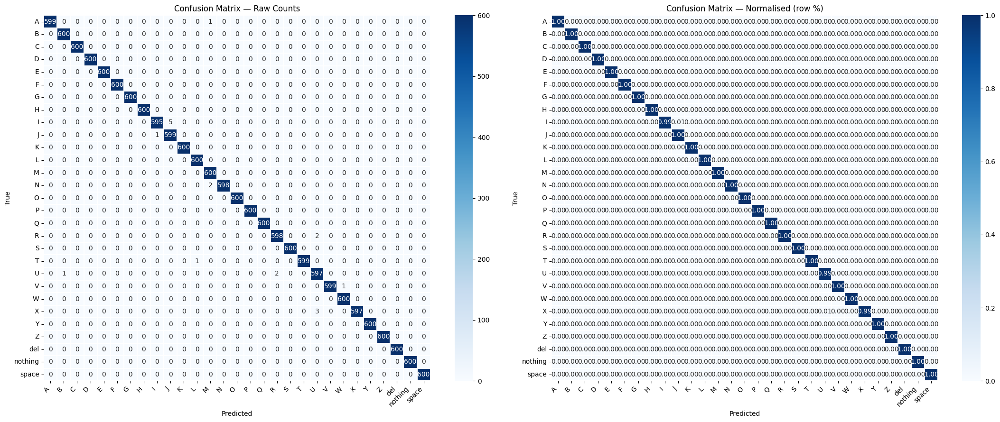

In [54]:
cm = confusion_matrix(val_labels, val_preds)
cm_norm = cm.astype(float) / cm.sum(axis=1, keepdims=True)

fig, axes = plt.subplots(1, 2, figsize=(22, 9))
for ax, data, title, fmt in zip(
    axes,
    [cm, cm_norm],
    ["Confusion Matrix — Raw Counts", "Confusion Matrix — Normalised (row %)"],
    ["d", ".2f"]
):
    sns.heatmap(data, annot=True, fmt=fmt, cmap="Blues",
                xticklabels=class_names, yticklabels=class_names,
                linewidths=0.3, ax=ax, cbar=True)
    ax.set_xlabel("Predicted"); ax.set_ylabel("True"); ax.set_title(title)
    plt.setp(ax.xaxis.get_majorticklabels(), rotation=45, ha="right")
    plt.setp(ax.yaxis.get_majorticklabels(), rotation=0)

plt.tight_layout()
plt.savefig(RESULTS_DIR / "confusion_matrix.png", dpi=150, bbox_inches="tight")
plt.show()

### 6.4. Per-Class Accuracy Plots

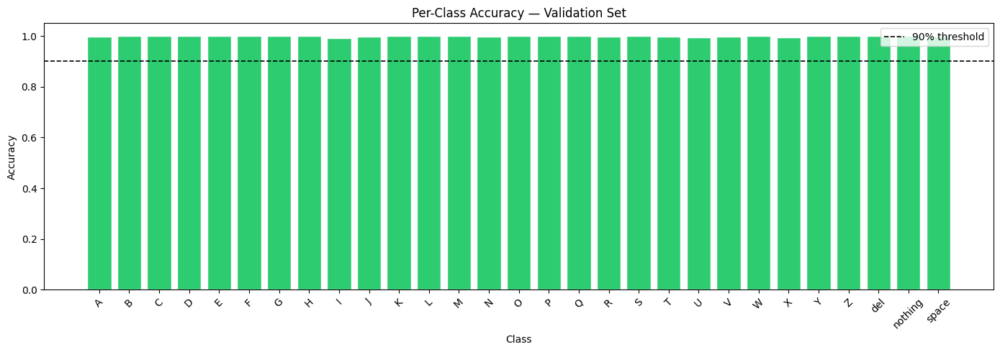

In [55]:
per_class_acc = cm_norm.diagonal()

fig, ax = plt.subplots(figsize=(14, 5))
colors = ["#2ecc71" if v >= 0.9 else "#e67e22" if v >= 0.7 else "#e74c3c"
          for v in per_class_acc]
ax.bar(class_names, per_class_acc, color=colors, edgecolor="white")
ax.axhline(0.9, color="black", ls="--", lw=1.2, label="90% threshold")
ax.set_title("Per-Class Accuracy — Validation Set")
ax.set_xlabel("Class"); ax.set_ylabel("Accuracy")
ax.set_ylim(0, 1.05); ax.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.savefig(RESULTS_DIR / "per_class_accuracy.png", dpi=150)
plt.show()

### 6.5. Intelligent Validation Batching 

- Samples N images per class from the validation set and shows the model's prediction confidence.
- Useful for identifying which classes are confused and whether errors are systematic.

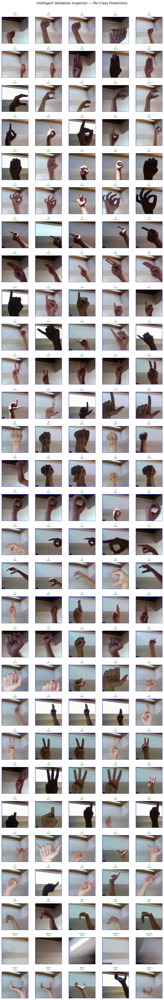

In [56]:
def class_inspector(model, val_set, class_names, n_per_class=4, seed=SEED):
    """Show n_per_class images per class with predicted label and confidence."""
    rng = random.Random(seed)
    # Group val indices by true label
    label_to_indices = {i: [] for i in range(len(class_names))}
    for idx in range(len(val_set)):
        _, lbl = val_set[idx]
        label_to_indices[lbl].append(idx)

    model.eval()
    inv_norm = transforms.Normalize(
        mean=[-m/s for m, s in zip([0.485,0.456,0.406],[0.229,0.224,0.225])],
        std=[1/s for s in [0.229,0.224,0.225]]
    )

    n_classes = len(class_names)
    fig, axes = plt.subplots(n_classes, n_per_class,
                             figsize=(n_per_class * 2, n_classes * 2))
    plt.suptitle("Intelligent Validation Inspector — Per-Class Predictions",
                 fontsize=14, y=1.002)

    for cls_idx, cls_name in enumerate(class_names):
        idxs = rng.sample(label_to_indices[cls_idx],
                          min(n_per_class, len(label_to_indices[cls_idx])))
        for col, idx in enumerate(idxs):
            img_tensor, true_lbl = val_set[idx]
            with torch.no_grad():
                logits = model(img_tensor.unsqueeze(0).to(device))
                prob   = torch.softmax(logits, dim=1)[0]
                pred   = prob.argmax().item()
                conf   = prob[pred].item()

            # Denormalise for display
            img_disp = inv_norm(img_tensor).permute(1,2,0).clamp(0,1).numpy()
            ax = axes[cls_idx][col]
            ax.imshow(img_disp)
            correct = pred == true_lbl
            title_color = "green" if correct else "red"
            ax.set_title(f"{class_names[pred]}\n{conf:.0%}",
                         fontsize=7, color=title_color)
            ax.axis("off")
        # Label the row
        axes[cls_idx][0].set_ylabel(cls_name, fontsize=8, rotation=0,
                                    labelpad=40, va="center")

    plt.tight_layout()
    plt.savefig(RESULTS_DIR / "validation_inspector.png", dpi=120, bbox_inches="tight")
    plt.show()

class_inspector(model, val_set, class_names, n_per_class=5)

## 7. XAI - Grad-Camm & Grad-CAM++

In [57]:
class GradCAM:
    def __init__(self, model, target_layer):
        self.model = model; self.target_layer = target_layer
        self.gradients = None; self.activations = None
        target_layer.register_forward_hook(self._save_activation)
        target_layer.register_full_backward_hook(self._save_gradient)

    def _save_activation(self, _, __, output): self.activations = output.detach()
    def _save_gradient(self, _, __, grad_output): self.gradients = grad_output[0].detach()

    def generate(self, img_tensor, class_idx=None):
        self.model.eval()
        img_tensor = img_tensor.unsqueeze(0).to(device).requires_grad_(True)
        logits = self.model(img_tensor)
        if class_idx is None: class_idx = logits.argmax(1).item()
        self.model.zero_grad()
        logits[0, class_idx].backward()
        weights = self.gradients.mean(dim=(2, 3), keepdim=True)
        cam = (weights * self.activations).sum(dim=1, keepdim=True)
        cam = torch.relu(cam).squeeze().cpu().numpy()
        cam = (cam - cam.min()) / (cam.max() - cam.min() + 1e-8)
        return cam, class_idx, torch.softmax(logits, dim=1)[0, class_idx].item()


class GradCAMPlusPlus(GradCAM):
    def generate(self, img_tensor, class_idx=None):
        self.model.eval()
        img_tensor = img_tensor.unsqueeze(0).to(device).requires_grad_(True)
        logits = self.model(img_tensor)
        if class_idx is None: class_idx = logits.argmax(1).item()
        self.model.zero_grad()
        score = logits[0, class_idx]
        score.backward()

        grads  = self.gradients          # (1, C, H, W)
        acts   = self.activations        # (1, C, H, W)
        grads2 = grads ** 2
        grads3 = grads ** 3
        denom  = 2 * grads2 + acts * grads3.sum(dim=(2,3), keepdim=True) + 1e-8
        alpha  = grads2 / denom
        weights = (alpha * torch.relu(grads)).sum(dim=(2, 3), keepdim=True)
        cam = (weights * acts).sum(dim=1, keepdim=True)
        cam = torch.relu(cam).squeeze().cpu().numpy()
        cam = (cam - cam.min()) / (cam.max() - cam.min() + 1e-8)
        return cam, class_idx, torch.softmax(logits, dim=1)[0, class_idx].item()


def overlay_cam(img_np, cam, alpha=0.5):
    """Overlay a CAM heatmap on an image."""
    import cv2
    cam_resized = cv2.resize(cam, (img_np.shape[1], img_np.shape[0]))
    heatmap = plt.cm.jet(cam_resized)[:, :, :3]
    return (alpha * heatmap + (1 - alpha) * img_np).clip(0, 1)

# ── Target layer: last conv block of EfficientNet-B0 ─────────────────────────
target_layer = model.features[-1]  # MBConv output — richest spatial features
gradcam      = GradCAM(model, target_layer)
gradcampp    = GradCAMPlusPlus(model, target_layer)

### 7.1 Grad-CAM vs Grad-CAM++ 

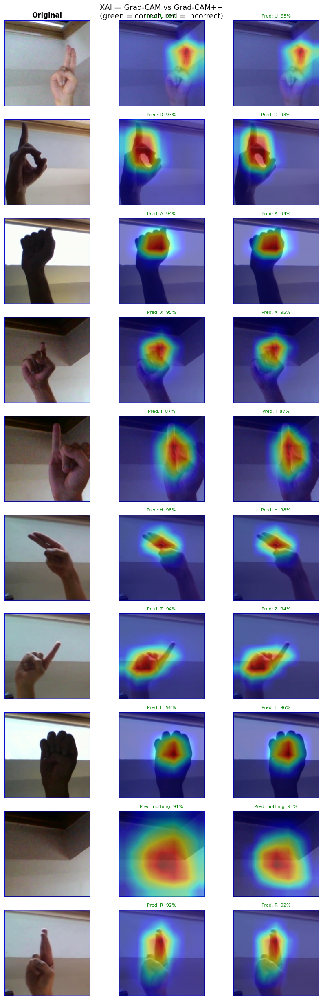

In [58]:
inv_norm = transforms.Normalize(
    mean=[-m/s for m, s in zip([0.485,0.456,0.406],[0.229,0.224,0.225])],
    std=[1/s for s in [0.229,0.224,0.225]]
)

def xai_grid(model, val_set, class_names, gradcam, gradcampp, n_classes=10, seed=SEED):
    """Show original / Grad-CAM / Grad-CAM++ side by side for n_classes."""
    rng = random.Random(seed)
    label_to_indices = {i: [] for i in range(len(class_names))}
    for idx in range(len(val_set)):
        _, lbl = val_set[idx]
        label_to_indices[lbl].append(idx)

    sampled_classes = rng.sample(range(len(class_names)), n_classes)
    fig, axes = plt.subplots(n_classes, 3, figsize=(9, n_classes * 2.5))
    col_titles = ["Original", "Grad-CAM", "Grad-CAM++"]
    for ax, t in zip(axes[0], col_titles):
        ax.set_title(t, fontsize=12, fontweight="bold")

    for row, cls_idx in enumerate(sampled_classes):
        idx = rng.choice(label_to_indices[cls_idx])
        img_tensor, true_lbl = val_set[idx]
        img_np = inv_norm(img_tensor).permute(1,2,0).clamp(0,1).numpy()

        cam_gc,  pred_gc,  conf_gc  = gradcam.generate(img_tensor)
        cam_gpp, pred_gpp, conf_gpp = gradcampp.generate(img_tensor)

        axes[row][0].imshow(img_np)
        axes[row][0].set_ylabel(class_names[true_lbl], fontsize=10,
                                rotation=0, labelpad=50, va="center")

        axes[row][1].imshow(overlay_cam(img_np, cam_gc))
        axes[row][1].set_title(f"Pred: {class_names[pred_gc]}  {conf_gc:.0%}",
                               fontsize=8, color="green" if pred_gc==true_lbl else "red")

        axes[row][2].imshow(overlay_cam(img_np, cam_gpp))
        axes[row][2].set_title(f"Pred: {class_names[pred_gpp]}  {conf_gpp:.0%}",
                               fontsize=8, color="green" if pred_gpp==true_lbl else "red")

        for ax in axes[row]: ax.axis("off")

    plt.suptitle("XAI — Grad-CAM vs Grad-CAM++\n(green = correct, red = incorrect)",
                 fontsize=13)
    plt.tight_layout()
    plt.savefig(RESULTS_DIR / "xai_gradcam_comparison.png", dpi=150, bbox_inches="tight")
    plt.show()

xai_grid(model, val_set, class_names, gradcam, gradcampp, n_classes=10)

### 7.2. XAI on Misclassified Examples

Total misclassified: 19 / 17400 (0.1%)


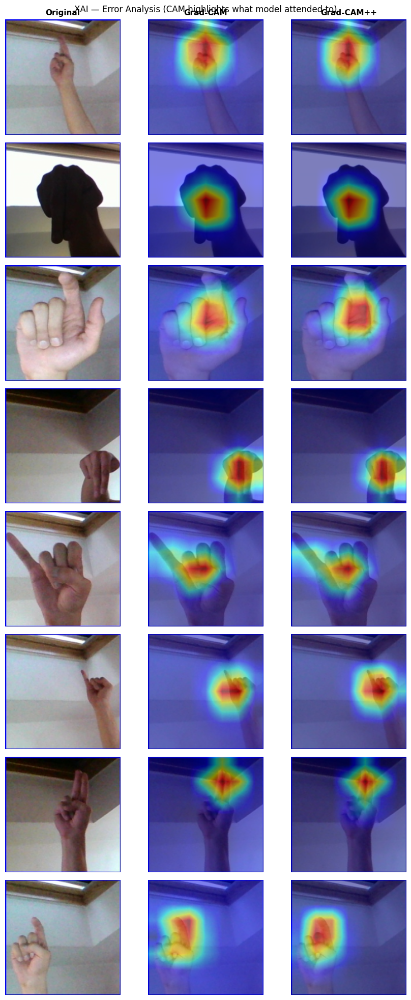

In [60]:
def xai_errors(model, val_set, class_names, gradcam, gradcampp,
               val_preds, val_labels, n=8, seed=SEED):
    rng = random.Random(seed)
    # Use already-computed predictions — no re-scan needed
    errors = [(idx, val_labels[idx], val_preds[idx])
              for idx in range(len(val_preds))
              if val_preds[idx] != val_labels[idx]]
    sample_errors = rng.sample(errors, min(n, len(errors)))
    print(f"Total misclassified: {len(errors)} / {len(val_preds)} "
          f"({100*len(errors)/len(val_preds):.1f}%)")

    fig, axes = plt.subplots(len(sample_errors), 3, figsize=(9, len(sample_errors)*2.5))
    if len(sample_errors) == 1: axes = [axes]
    axes[0][0].set_title("Original",    fontsize=11, fontweight="bold")
    axes[0][1].set_title("Grad-CAM",    fontsize=11, fontweight="bold")
    axes[0][2].set_title("Grad-CAM++",  fontsize=11, fontweight="bold")

    for row, (idx, true_lbl, pred_lbl) in enumerate(sample_errors):
        img_tensor, _ = val_set[idx]
        img_np = inv_norm(img_tensor).permute(1,2,0).clamp(0,1).numpy()
        cam_gc,  _, _ = gradcam.generate(img_tensor, class_idx=pred_lbl)
        cam_gpp, _, _ = gradcampp.generate(img_tensor, class_idx=pred_lbl)

        axes[row][0].imshow(img_np)
        axes[row][0].set_ylabel(f"True: {class_names[true_lbl]}\nPred: {class_names[pred_lbl]}",
                                fontsize=8, rotation=0, labelpad=65, va="center", color="red")
        axes[row][1].imshow(overlay_cam(img_np, cam_gc))
        axes[row][2].imshow(overlay_cam(img_np, cam_gpp))
        for ax in axes[row]: ax.axis("off")

    plt.suptitle("XAI — Error Analysis (CAM highlights what model attended to)",
                 fontsize=12)
    plt.tight_layout()
    plt.savefig(RESULTS_DIR / "xai_error_analysis.png", dpi=150, bbox_inches="tight")
    plt.show()

xai_errors(model, val_set, class_names, gradcam, gradcampp, val_preds, val_labels, n=8)

## 8. Summary

In [61]:
print("=" * 60)
print("  PHASE 1 BASELINE — SUMMARY")
print("=" * 60)
print(f"  Model           : EfficientNet-B0 (ImageNet → ASL fine-tune)")
print(f"  Dataset         : ASL Alphabet ({len(df):,} images, {len(class_names)} classes)")
print(f"  Val split       : {VAL_SPLIT:.0%} stratified (seed={SEED})")
print(f"  Accuracy        : {metrics['accuracy']:.4f}")
print(f"  F1 (macro)      : {metrics['f1_macro']:.4f}")
print(f"  F1 (weighted)   : {metrics['f1_weighted']:.4f}")
print(f"  Top-3 Accuracy  : {metrics['top3_accuracy']:.4f}")
print(f"  Top-5 Accuracy  : {metrics['top5_accuracy']:.4f}")
print(f"  Best checkpoint : checkpoints/best_asl_model.pth")
print("=" * 60)

  PHASE 1 BASELINE — SUMMARY
  Model           : EfficientNet-B0 (ImageNet → ASL fine-tune)
  Dataset         : ASL Alphabet (87,000 images, 29 classes)
  Val split       : 20% stratified (seed=42)
  Accuracy        : 0.9989
  F1 (macro)      : 0.9989
  F1 (weighted)   : 0.9989
  Top-3 Accuracy  : 1.0000
  Top-5 Accuracy  : 1.0000
  Best checkpoint : checkpoints/best_asl_model.pth
